<a href="https://colab.research.google.com/github/gabrieletirrito/urban/blob/main/Urban_mobility.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Abstract**

The object of this analysis is the demand for mobility for lines of the urban public transport system, in a small-sized urban reality.

Having only one origin-destination matrix available, I had to estimate which lines are more likely to be taken through a random simulation of shortest paths (Dijkstra), so that the most frequently traveled trips are favored in the process of random creation. At each iteration, therefore, two pairs of origin-destination are randomly selected, and the one corresponding to a greater flow on the origin-destination matrix is ​​chosen.

The graph on which the algorithm is run is made of nodes which can represent either the intersections of the road network or the urban bus stops. The edges, on the other hand, either represent the walking time between the various nodes that make up the road network or the travel time between two stops by bus: the former were estimated by dividing the distance between the two nodes by the average speed of a walking man, the others are time-dependent and at each iteration of Dikstra's algorithm are calculated from the bus time-tables.
The time component is certainly of great importance when trying to estimate the mobility demand, however the data available on the origin-destination matrix does not provide us with this information, so I have chosen a random generation of the departure time.
There’s also another class of edges, on the other hand, which  represents the connections between the road network (and therefore the footpaths) with the public transport network. In this case the edges weights represents the time required to get on or off the bus. At the end of the simulation I will show some statistics on the list of generated shortest paths in order to visualize the proportion in which each urban line responds to the mobility demand emerging from the origin-destination matrix.

In this project I have chosen to focus my analysis on a small city in the center of Sicily called Enna. Despite having just over 25,000 inhabitants, the strong expansion of the new area of ​​Enna 2 (driven by the opening of a private university and new buildings at a good price) must lead us to ask ourselves whether the urban transport service is effective in connecting the three urban aggregates of the municipality: Enna Alta, Enna Bassa and the Pergusa village.

Lastly, In this application I'll try to estimate the bus line demand shifts when suppressing the line 2.


# Configuration

In [ ]:
!pip install osmnx
!pip install googlemaps
!pip install contextily

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import folium
import osmnx as ox
import networkx as nx
import googlemaps as gmaps
import geopandas as gpd
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import contextily as ctx
from pyproj import CRS
import time
from shapely.geometry import Point, LineString, Polygon
import json
from branca.colormap import linear
import builtins
from datetime import datetime
from collections import defaultdict
import random
import warnings
import seaborn as sns
from shapely import geometry
from scipy.spatial import Voronoi
import community.community_louvain as com

# Data preparation

The road network information was downloaded directly on my script from the OSMNX python API.

The geographical position of the stops was downloaded instead with a specific query on the OSM turbo over-pass portal in geojson format.

While the time-tables and the order of the stops were obtained manually from the Sais official website and then converted into a CSV file.

Finally, I downloaded the origin-destination matrix from TomTom's O/D Analysis portal. However, to have the origin destination matrix I needed a partitioning of the urban area into functional zones. The maximum limit of cluster areas from the free version of the Tomtom Portal was 200 zones. I then applied the Louvaine’s clustering algorithm on the road network of Enna; to extend the clustering on the spatial dimension, I built Voronoi Polygons around each node of the road network and then merged together into various clusters identified by the Louvaine’s algorithm.





In [4]:
bus_lines_gdf = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/export_stops.geojson')
urban_lines_gdf = bus_lines_gdf[bus_lines_gdf['network']=='trasporto urbano'].loc[[0,11,12,13],]

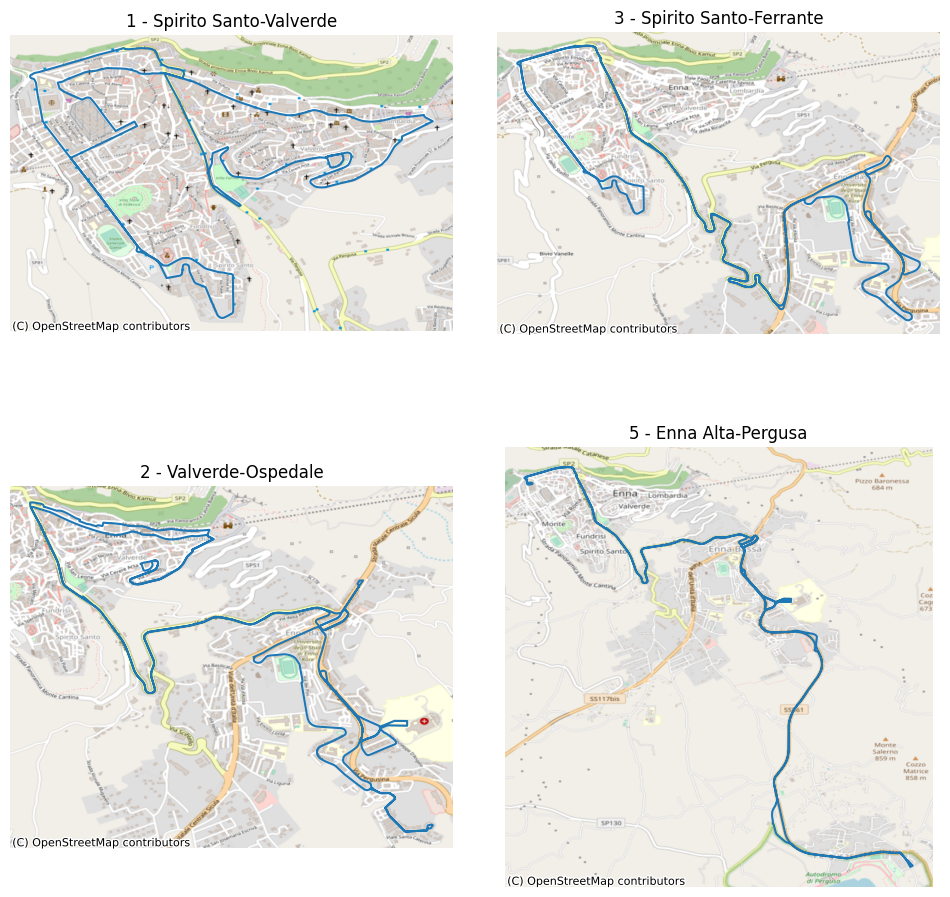

In [5]:
# Create a 2x2 grid of subplots for the facets
fig, axs = plt.subplots(2, 2, figsize=(12, 12))
fig.subplots_adjust(wspace=0.1, hspace=0.1)

# Iterate over the rows in the GeoDataFrame and plot each multiline string geometry
for row in range(0, len(urban_lines_gdf)):
    ax = axs[row // 2, row % 2]
    current_row = urban_lines_gdf.iloc[[row]]
    attribute_value = current_row['name'].values[0]  # Replace 'attribute_name' with the actual column name

    # Plot the geometry and add basemap
    current_row.plot(ax=ax)
    ctx.add_basemap(ax, crs=urban_lines_gdf.crs.to_string(), source=ctx.providers.OpenStreetMap.Mapnik)

    # Set the attribute value as the title of the subplot
    ax.set_title(attribute_value)

    # Remove labels and axis
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)

plt.show()


The company responsible for providing the urban public transport service of Enna is Sais S.p.a, a historical company founded in Enna in 1926. The urban service consists of four lines: line 1 runs only through Enna Alta, lines 3 and 2 serve to connect Enna Alta and Enna Bassa, finally line 5 is the only line that connects the Pergusa village to Enna Bassa and Enna Alta.


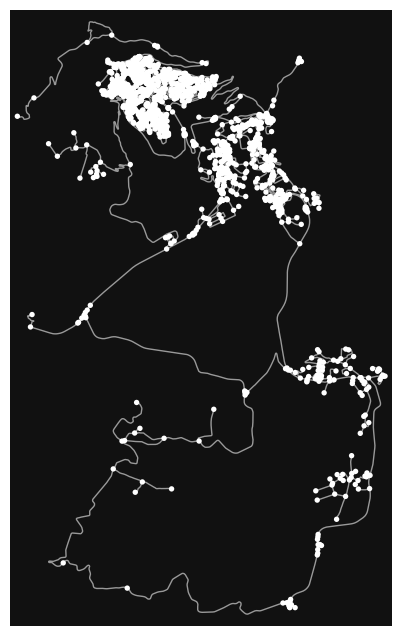

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [6]:
# Download the "drivable" street network data from OpenStreetMap
graph = ox.graph_from_bbox(37.5745, 37.4875, 14.3200, 14.2506, network_type='drive',custom_filter ='["highway"~"primary|secondary|tertiary|residential"]')
graph = ox.utils_graph.get_undirected(graph)
gdf_nodes, gdf_edges = ox.graph_to_gdfs(graph)

#Plot the network
ox.plot_graph(ox.project_graph(graph),figsize=(8, 8))

From this picture we can visualize the subdivision of the municipality into 3 urban centres.
At the top there is Enna Alta which, located above a mountain.
Then, we can observe Enna Bassa, connected by some roads along the mountainsides.
At the bottom the Pergusa village.

### Speed

Data on speeds of several categories are downloaded from the TOMTOM portal as geojson file and then attached to the road network in order to better isolate the functional areas while performing the Louvain Algorithm.

Lastly, I plot the evolution of the travel time along 24h timespan so to better visualize and to have a measure of mobility demand in every hour of the day. It seems that the most bottlenecked hour is around 7 p.m.


In [ ]:
# Read the GeoJSON file
gdf = gpd.read_file("/content/drive/MyDrive/Colab Notebooks/jobs_3252101_results_enna.geojson").drop(0)
gdf_clean = gdf[['segmentId','speedLimit','distance','segmentTimeResults','geometry','frc','streetName']]

for index,row in gdf_clean.iterrows():
  dic = json.loads(row['segmentTimeResults'])
  l=[]
  w =[]
  for j in dic:
    l.append(j['averageSpeed'])
    w.append(j['sampleSize'])
  if sum(w) != 0:
        avg_speed = np.average(l, weights=w)
        gdf_clean.loc[index, 'typical_speed'] = avg_speed
  else:
        gdf_clean.loc[index, 'typical_speed'] = None

def get_typical_speed_cat(x,y):
  filtered_gdf = gdf_clean[gdf_clean['frc'].isin([x,y])]

  # Filter the GeoDataFrame by dropping missing values in 'typical_speed'
  filtered_gdf = filtered_gdf.dropna(subset=['typical_speed'])

  return filtered_gdf['typical_speed'].mean()

speed_category = {"p":get_typical_speed_cat(2,3), "s": get_typical_speed_cat(4,5), "t":get_typical_speed_cat(4,5), "r": get_typical_speed_cat(6,7),"u": get_typical_speed_cat(7,7)}

for u,v,data in graph.edges(data = True):
  data['speed']=speed_category[data['highway'][0][0]]
  data['travel_time']=data['length']/data['speed']


In [ ]:

df_speed= pd.DataFrame()
for index,row in gdf_clean.iterrows():
  dic = json.loads(row['segmentTimeResults'])
  l=[]
  for j in dic:
    l.append((j['averageSpeed'], j['sampleSize']))
  l.append(row['segmentId'])
  df_speed[str(row['segmentId'])]= l

serie = []
for ind,row in df_speed.drop(24).iterrows():
  avg_list = []
  sam_list = []
  for i in row:
    avg_list.append(i[0])
    sam_list.append(i[1])
  serie.append(np.average(avg_list,weights = sam_list))

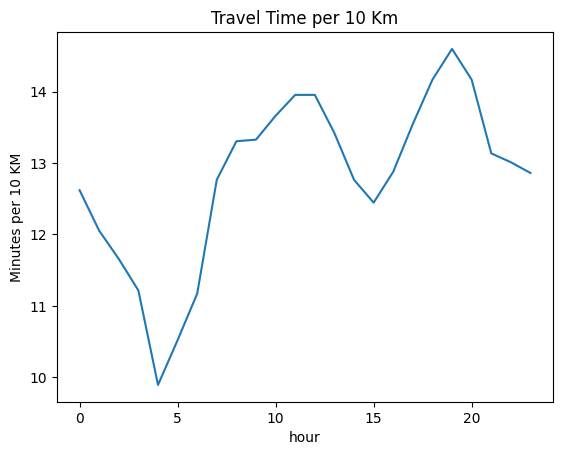

In [9]:
a = [60*10/x for x in serie]
#print(np.mean(serie))
plt.plot(a)

# Add labels and title
plt.xlabel('hour')
plt.ylabel('Minutes per 10 KM')
plt.title('Travel Time per 10 Km')

# Show the plot
plt.show()

### Louvain Partitioning

In [10]:
partition = com.best_partition(graph, resolution =28, weight='travel_time', random_state = 15)
communities = [[] for i in range(builtins.max(list(partition.values())) + 1)]
for key,val in partition.items():
    communities[val].append(key)
print(len(communities)) #Number of Communities

def plotClusters(grouping):
    df = ox.geocoder.geocode_to_gdf('Enna')
    lat = df['lat']
    lon = df['lon']
    mp = folium.Map((lat, lon), zoom_start = 12)
    lat, lon
    import random
    get_colors = lambda n: ["#%06x" % random.randint(0, 0xFFFFFF) for _ in range(n)]
    l = get_colors(len(communities)) # sample return:  ['#8af5da', '#fbc08c', '#b741d0']

    for node in graph.nodes():

        folium.CircleMarker(
            location=[graph.nodes()[node]['y'], graph.nodes()[node]['x']],
            radius=3,
            color=l[grouping[node]],
            stroke=False,
            fill=True,
            fill_opacity=0.6,
            opacity=1,
        ).add_to(mp)

    mp.save("LOUVAAAAAAIN.html")
    return mp


plotClusters(partition)

186


The Louvain Algorithm has identified 185 clusters, which can be directly visualized on the map above.

In the chucks of codes below I built a voronoi polygon around each node of the road map and then I merged the polygons within the same cluster.

In the end, I exported the polygons in json format in order to load it in the TomTom O/D Analysis portal.

In [11]:

class VoronoiRegion:
    def __init__(self, region_id):
        self.id = region_id
        self.vertices = []
        self.is_inf = False
        self.point_inside = None

    def __str__(self):
        text = f'region id={self.id}'
        if self.point_inside:
            point_idx, point = self.point_inside
            text = f'{text}[point:{point}(point_id:{point_idx})]'
        text += ', vertices: '
        if self.is_inf:
            text += '(inf)'
        for v in self.vertices:
            text += f'{v}'
        return text

    def __repr__(self):
        return str(self)

    def add_vertex(self, vertex, vertices):
        if vertex == -1:
            self.is_inf = True
        else:
            point = vertices[vertex]
            self.vertices.append(point)

def voronoi_to_voronoi_regions(voronoi):
    voronoi_regions = []

    for i, point_region in enumerate(voronoi.point_region):
        region = voronoi.regions[point_region]
        vr = VoronoiRegion(point_region)
        for r in region:
            vr.add_vertex(r, voronoi.vertices)
        vr.point_inside = (i, voronoi.points[i])
        voronoi_regions.append(vr)
    return voronoi_regions

points = pd.DataFrame(gdf_nodes['geometry'])

coordinates_list = [[point.x, point.y] for point in list(points.geometry)]
vor = Voronoi(coordinates_list)
regions = voronoi_to_voronoi_regions(vor)

# Create an empty list to store the Voronoi polygons
voronoi_polygons = pd.DataFrame(columns=['node_coordinates', 'area_id', 'geometry'])

for r in regions:


    # Create a polygon from the region vertices
    polygon = Polygon(r.vertices)

    insert_row = {'node_coordinates':r.point_inside,'area_id':r.id,'geometry':polygon}

    voronoi_polygons = pd.concat([voronoi_polygons, pd.DataFrame([insert_row])])


In [12]:
voronoi_gdf = gpd.GeoDataFrame(voronoi_polygons)
voronoi_gdf.set_crs('EPSG:4326', inplace=True)

# Convert the dictionary into a list of tuples
data_list = list(partition.items())

# Create the DataFrame
df = pd.DataFrame(data_list, columns=['node_id', 'cluster'])

voronoi_gdf.reset_index(drop=True, inplace=True)
df.reset_index(drop=True, inplace=True)
voronoi_gdf = pd.concat([voronoi_gdf , df], axis=1)

voronoi_gdf = voronoi_gdf.to_crs(crs='EPSG:4326')

In [13]:
# Define the bounding box coordinates
north = 37.5745
south = 37.4875
east = 14.3200
west = 14.2506

# Create a DataFrame with the bbox coordinates
data = {'id': [1], 'geometry': [Polygon([(west, south), (west, north), (east, north), (east, south)])]}
df = pd.DataFrame(data)

# Convert the DataFrame into a GeoDataFrame
gdf_bbox = gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')


<Axes: >

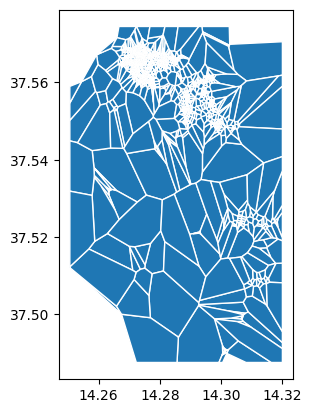

In [14]:
thiessens = gpd.overlay(voronoi_gdf, gdf_bbox, how='intersection')
thiessens.plot(edgecolor='white')

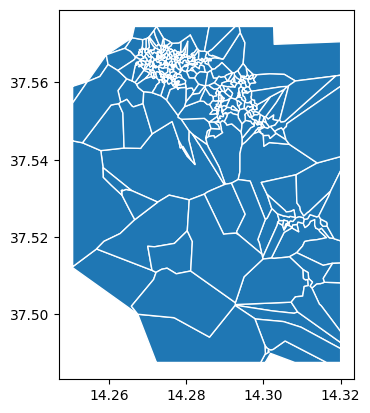

In [15]:
cluster_gdf = gpd.GeoDataFrame(columns = ['cluster','geometry'])
for i in range(0,len(communities)):
  multipol = thiessens[thiessens['cluster']==i].geometry.unary_union
  insert_row = {'cluster':i,'geometry':multipol}
  cluster_gdf = pd.concat([cluster_gdf, pd.DataFrame([insert_row])])


cluster_gdf.plot(edgecolor='white')
cluster_gdf.set_crs(crs='EPSG:4326')
# Save the GeoDataFrame as a GeoJSON file
cluster_gdf.to_file('communities.json', driver='GeoJSON')


## Origin-Destination Matrix

In the chunk below the origin destination matrix is loaded and converted in a squared matrix and displayed on the map.

In [16]:
origin_destination = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/enna_od.csv')
origin_destination.columns = ["origin","destination","trips"]

matrix = np.zeros((185,185))
for i,data in origin_destination.iterrows():
  origin = int(data['origin'][7:])-1
  destination = int(data['destination'][7:])-1
  matrix[origin][destination] = data['trips']

upper_matrix = np.zeros((185,185))
for i in range(185):
    for j in range(i + 1, 185):
        sum = matrix[i][j]+matrix[j][i]
        orig_area = cluster_gdf.iloc[i,1].area*1000
        dest_area = cluster_gdf.iloc[j,1].area*1000
        sum_area = orig_area+dest_area
        upper_matrix[i][j] = sum/sum_area

#upper_matrix = upper_matrix/np.max(upper_matrix)
colormap = linear.YlOrRd_09.scale(0, 1)

flows = folium.Map(location=(37.559536, 14.281404), zoom_start=13)
min, max = np.min(upper_matrix), np.max(upper_matrix)
for i in range(185):
    for j in range(i + 1, 185):

        sum_f = matrix[i][j]+matrix[j][i]

        if True:
          orig = cluster_gdf.iloc[i,1].centroid
          dest = cluster_gdf.iloc[j,1].centroid
          orig_area = cluster_gdf.iloc[i,1].area
          dest_area = cluster_gdf.iloc[j,1].area
          color = colormap(sum_f)
          folium.PolyLine(locations=[(orig.y,orig.x),(dest.y,dest.x)], color = colormap((sum_f/(orig_area*700+dest_area*700)- min) / (max - min)), opacity = ((sum_f/(orig_area*1000+dest_area*1000) - min) / (max - min))).add_to(flows)

flows

The map above shows the values of the Origin-Destionation Matrix using darker lines which represent denser flows between to clusters of nodes. The value on the origin-destination matrix has been adjusted by the sum of the origin and the destination areas, to take into account that clusters have different shapes and size.
It's quite obvious that the mobility demand in Enna Bassa is more intense than Enna Alta and that in general people tend to use cars to move inside the urban center.

#Time Tables importing and preprocessing

In [17]:
uno = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/uno.csv',header = None)
due = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/due.csv',header = None)
tre = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/tre.csv',header = None)
cinque = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/cinque.csv',header = None)

In [18]:
# Function to convert time to numerical value
def time_to_minutes(time_str):
    time_obj = datetime.strptime(time_str, '%H:%M')
    return time_obj.hour * 60 + time_obj.minute

stops = []
time = []
for i in range(0, len(uno), 2):
    stops.append(uno.iloc[i,0])
    time.append(uno.iloc[i + 1,0])

uno_pd = pd.DataFrame({'stops':stops,'time':time})

# Apply the function to the 'Time' column and create a new column 'Minutes'
uno_pd['Minutes'] = uno_pd['time'].apply(time_to_minutes)

# Print the DataFrame to see the result
uno_pd['line'] = ['1']*len(uno_pd)
uno_pd = uno_pd.replace('\xa0', '', regex=True).sort_values(by='Minutes', ascending=True)

stops = []
time = []
for i in range(0, len(due), 2):
    stops.append(due.iloc[i,0])
    time.append(due.iloc[i + 1,0])

due_pd = pd.DataFrame({'stops':stops,'time':time})

# Apply the function to the 'Time' column and create a new column 'Minutes'
due_pd['Minutes'] = due_pd['time'].apply(time_to_minutes)

# Print the DataFrame to see the result
due_pd['line'] = ['2']*len(due_pd)
due_pd = due_pd.replace('\xa0', '', regex=True).sort_values(by='Minutes', ascending=True)

stops = []
time = []
for i in range(0, len(tre), 2):
    stops.append(tre.iloc[i,0])
    time.append(tre.iloc[i + 1,0])

tre_pd = pd.DataFrame({'stops':stops,'time':time})

# Apply the function to the 'Time' column and create a new column 'Minutes'
tre_pd['Minutes'] = tre_pd['time'].apply(time_to_minutes)

# Print the DataFrame to see the result
tre_pd['line'] = ['3']*len(tre_pd)
tre_pd = tre_pd.replace('\xa0', '', regex=True).sort_values(by='Minutes', ascending=True)

stops = []
time = []
for i in range(0, len(cinque), 2):
    stops.append(cinque.iloc[i,0])
    time.append(cinque.iloc[i + 1,0])

cinque_pd = pd.DataFrame({'stops':stops,'time':time})

# Apply the function to the 'Time' column and create a new column 'Minutes'
cinque_pd['Minutes'] = cinque_pd['time'].apply(time_to_minutes)

# Print the DataFrame to see the result
cinque_pd['line'] = ['5']*len(cinque_pd)
cinque_pd = cinque_pd.replace('\xa0', '', regex=True).sort_values(by='Minutes', ascending=True)


In [19]:
uno_pd

,stops,time,Minutes,line
0,Via Spirito Santo 144,06:55,415,1
1,Via Spirito Santo 123,06:56,416,1
2,Via Risorgimento 20,06:57,417,1
3,Viale IV Novembre 13,06:58,418,1
4,Viale Diaz 10,07:00,420,1
...,...,...,...,...
283,Viale IV Novembre 8,14:51,891,1
284,Piazza Europa,14:52,892,1
285,Via Cav.Vittorio Veneto 48,14:53,893,1
286,Via Cav.Vittorio Veneto (x Via Piave),14:54,894,1


In [ ]:
df1 = pd.DataFrame(columns = ['from','to','departure','travel','line'])
for i in range(0,(len(uno_pd)-1)):
  df1 = df1.append({'from': uno_pd.loc[i,'stops'], 'to': uno_pd.loc[i+1,'stops'], 'departure': uno_pd.loc[i,'Minutes'], 'travel': (uno_pd.loc[i+1,'Minutes']- uno_pd.loc[i,'Minutes']), 'line': '1'},ignore_index=True)

df2 = pd.DataFrame(columns = ['from','to','departure','travel','line'])
for i in range(0,(len(due_pd)-1)):
  df2 = df2.append({'from': due_pd.loc[i,'stops'], 'to': due_pd.loc[i+1,'stops'], 'departure': due_pd.loc[i,'Minutes'], 'travel': (due_pd.loc[i+1,'Minutes']- due_pd.loc[i,'Minutes']), 'line': '2'},ignore_index=True)

df3 = pd.DataFrame(columns = ['from','to','departure','travel','line'])
for i in range(0,(len(tre_pd)-1)):
  df3 = df3.append({'from': tre_pd.loc[i,'stops'], 'to': tre_pd.loc[i+1,'stops'], 'departure': tre_pd.loc[i,'Minutes'], 'travel': (tre_pd.loc[i+1,'Minutes']- tre_pd.loc[i,'Minutes']), 'line': '3'},ignore_index=True)

df5 = pd.DataFrame(columns = ['from','to','departure','travel','line'])
for i in range(0,(len(cinque_pd)-1)):
  df5 = df5.append({'from': cinque_pd.loc[i,'stops'], 'to': cinque_pd.loc[i+1,'stops'], 'departure': cinque_pd.loc[i,'Minutes'], 'travel': (cinque_pd.loc[i+1,'Minutes']- cinque_pd.loc[i,'Minutes']), 'line': '5'},ignore_index=True)


In [21]:
df1

,from,to,departure,travel,line
0,Via Spirito Santo 144,Via Spirito Santo 123,415,1,1
1,Via Spirito Santo 123,Via Risorgimento 20,416,1,1
2,Via Risorgimento 20,Viale IV Novembre 13,417,1,1
3,Viale IV Novembre 13,Viale Diaz 10,418,2,1
4,Viale Diaz 10,Via Trieste 2,420,1,1
...,...,...,...,...,...
282,Viale Diaz 47,Viale IV Novembre 8,889,2,1
283,Viale IV Novembre 8,Piazza Europa,891,1,1
284,Piazza Europa,Via Cav.Vittorio Veneto 48,892,1,1
285,Via Cav.Vittorio Veneto 48,Via Cav.Vittorio Veneto (x Via Piave),893,1,1


In [22]:
timetable = pd.concat([df1,df2,df3,df5], ignore_index = True)
timetable1 = pd.concat([df1,df3,df5], ignore_index = True)

In [23]:
stops = gpd.read_file('/content/drive/MyDrive/Colab Notebooks/export (7).geojson')
stops.rename(columns={'name': 'stops'}, inplace=True)
stops[['stops','geometry']]

,stops,geometry
0,Messina Sud Tremestieri,POINT (15.51863 38.13967)
1,NaN,POINT (15.10039 37.50861)
2,NaN,"LINESTRING (13.85557 37.34093, 13.85571 37.34090)"
3,Via Ernesto Basile,"LINESTRING (13.34620 38.09851, 13.34620 38.098..."
4,Via Liguria,"LINESTRING (14.29005 37.55056, 14.28918 37.551..."
...,...,...
3908,Viale Regione Siciliana Sud Est,"LINESTRING (13.36688 38.08861, 13.36557 38.088..."
3909,Via della Cittadella,"LINESTRING (14.28600 37.56575, 14.28600 37.565..."
3910,Via Pisacane,"LINESTRING (13.36197 38.10855, 13.36243 38.108..."
3911,Galleria Misericordia,"LINESTRING (14.28168 37.57942, 14.28384 37.579..."


<ipython-input-24-28ab38fb53a6>:12: UserWarning: Geometry is in a geographic CRS. Results from 'distance' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  li.append(gdf_nodes['geometry'].distance(d['geometry']).idxmin())


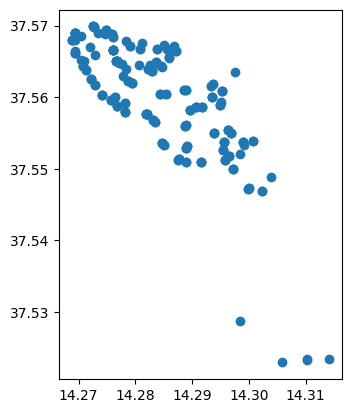

In [24]:
con = pd.concat([uno_pd, due_pd, tre_pd, cinque_pd], ignore_index=True)
con.rename(columns={'name': 'stops'}, inplace=True)
con = con[['stops','line']].drop_duplicates()
con = con.merge(stops[['geometry','stops']], on = 'stops')
con = gpd.GeoDataFrame(con, geometry = 'geometry')
con = con[con.geometry.type == 'Point']
con.set_crs('EPSG:4326')
con.plot()

li = []
for i,d in con.iterrows():
  li.append(gdf_nodes['geometry'].distance(d['geometry']).idxmin())

con['ass_node'] = li



In [25]:
con

,stops,line,geometry,ass_node
0,Via Spirito Santo 144,1,POINT (14.27815 37.55795),10956340124
1,Via Spirito Santo 144,3,POINT (14.27815 37.55795),10956340124
2,Via Spirito Santo 144,5,POINT (14.27815 37.55795),10956340124
3,Via Spirito Santo 123,1,POINT (14.27812 37.55920),10823910416
4,Via Spirito Santo 123,3,POINT (14.27812 37.55920),10823910416
...,...,...,...,...
227,Pergusa - Viale dei Miti (Campo Sportivo),5,POINT (14.31027 37.52324),528910480
228,Pergusa - Via Apollo Capolinea Urbano,5,POINT (14.31411 37.52338),2183389481
229,Pergusa - Viale dei Miti (Fronte Campo Sportivo),5,POINT (14.31022 37.52341),528910480
230,Via Giuseppe D'Angelo (VVFF),5,POINT (14.30384 37.54888),2187786386


#Building Graph and Simulation


Here I've created all the edges of 2 different graphs. In the second graph the line 2 is suppressed in order make an estimate of the effect on urban mobility of such a policy.

In [26]:
edg = []
#These edges connects the road network to the public transport network. They represents the action of take the bus
for i,d in con.iterrows():
  edg.append(((d['stops'], d['line']),d['ass_node'],0.5)) #A half of a minute to take the bus
  edg.append((d['ass_node'],(d['stops'], d['line']),0.5))


#Edges connecting bus stops by bus.
for i, d in df1.drop_duplicates(subset=['from', 'to','line']).iterrows():
  edg.append(((d['from'],d['line']),(d['to'],d['line']),'1'))

for i, d in df2.drop_duplicates(subset=['from', 'to','line']).iterrows():
  edg.append(((d['from'],d['line']),(d['to'],d['line']),'2'))

for i, d in df3.drop_duplicates(subset=['from', 'to','line']).iterrows():
  edg.append(((d['from'],d['line']),(d['to'],d['line']),'3'))

for i, d in df5.drop_duplicates(subset=['from', 'to','line']).iterrows():
  edg.append(((d['from'],d['line']),(d['to'],d['line']),'5'))

#Edges connecting road network wighted by walking travel time
for i,d in gdf_edges.iterrows():
  edg.append((i[0],i[1],(d['length']/0.5/60)))
  edg.append((i[1],i[0],(d['length']/0.5/60)))


In [27]:
#Same graphs but without the line 2
edg1 = []
for i,d in con.iterrows():
  edg1.append(((d['stops'], d['line']),d['ass_node'],0.5))
  edg1.append((d['ass_node'],(d['stops'], d['line']),0.5))

for i, d in df1.drop_duplicates(subset=['from', 'to','line']).iterrows():
  edg1.append(((d['from'],d['line']),(d['to'],d['line']),'1'))

for i, d in df3.drop_duplicates(subset=['from', 'to','line']).iterrows():
  edg1.append(((d['from'],d['line']),(d['to'],d['line']),'3'))

for i, d in df5.drop_duplicates(subset=['from', 'to','line']).iterrows():
  edg1.append(((d['from'],d['line']),(d['to'],d['line']),'5'))

for i,d in gdf_edges.iterrows():
  edg1.append((i[0],i[1],(d['length']/0.5/60)))
  edg1.append((i[1],i[0],(d['length']/0.5/60)))

The time-dependent Dijkstra's algorithm used in the code takes into account not only the edge weights (travel times) but also the timing of departures and the waiting time at transportation nodes. This enables it to find the shortest or quickest path in a transportation network where the schedule is a significant factor in route planning.
If a timetable-based check is required (when the edge weight is '1', '2', '3', or '5'), it checks the timetable to find the next available departure time and calculates waiting time and travel time accordingly.

In [28]:
def build_graph(edge_list):
    graph = defaultdict(list)
    seen_edges = defaultdict(int)
    for src, dst, weight in edge_list:
        seen_edges[(src, dst, weight)] += 1
        if seen_edges[(src, dst, weight)] > 1:  # checking for duplicated edge entries
            continue
        graph[src].append((dst, weight))
    return graph

def dijkstra(graph,timetb, src, dst=None, time=500):
    nodes = set(graph.keys())
    dist = {node: float('inf') for node in nodes}
    prev = {node: None for node in nodes}

    dist[src] = 0

    while nodes:
        u = builtins.min(nodes, key=dist.get)
        nodes.remove(u)

        if dst is not None and u == dst:
            return dist[dst], prev

        for v, w in graph.get(u, ()):
            if w in {'1', '2', '3', '5'}:
                tb = timetb[(timetb['from'] == u[0]) & (timetb['to'] == v[0]) & (timetb['line'] == w)]
                tb = tb.sort_values(by='departure')  # Ensure the timetable is sorted by departure time
                next_departure_index = (tb['departure'] >= (time + dist[u])).idxmax()
                if next_departure_index is not None:
                    next_departure_time = tb.loc[next_departure_index, 'departure']
                    waiting_time = next_departure_time - (time + dist[u])
                    if waiting_time < 0:
                        waiting_time += 1440  # Add 1440 minutes (1 day) to handle the case of overnight waiting
                    alt = dist[u] + waiting_time + tb.loc[next_departure_index, 'travel']
                else:
                    alt = float('inf')  # No feasible connection
            else:
                alt = dist[u] + w

            if alt < dist[v]:
                dist[v] = alt
                prev[v] = u

    return dist, prev

def find_path(pr, node):
    p = []
    while node is not None:
        p.append(node)
        node = pr[node]
    return p[::-1]

#Graph with line 2
g = build_graph(edg)

#GRaph without line 2
gf = build_graph(edg1)


In [37]:
#test
d, prev = dijkstra(g,timetable, 2532482163, 7315515286, time=850)
d1, prev1 = dijkstra(gf,timetable1, 2532482163, 7315515286,time=850)
path = find_path(prev, 7315515286)
path1 = find_path(prev1, 7315515286)
print("A -> E: distance = {}, path = {}".format(d, path))
print("A -> E: distance = {}, path = {}".format(d1, path1))

A -> E: distance = 22.497900000000058, path = [2532482163, 10968426248, 10968426257, 10968426261, ('Enna Bassa - Terminal Bus Via L. da Vinci 5', '2'), ('Via Pergusa - Sottopassaggio', '2'), ('Via Pergusa - Pizzeria Pinocchio', '2'), ('Via Pergusa - fronte Natura Viva', '2'), ('Via Pergusa (Cantina)', '2'), ('Via Pergusa - Bonasera bibite', '2'), ('Via Pergusa 139', '2'), ('Via Pergusa (fronte civico 210)', '2'), ('Via Pergusa (fronte civico 104)', '2'), ('Via Roma 326', '2'), 1779489778, 7315515286]
A -> E: distance = 52.565233333333346, path = [2532482163, 2116961008, 2532483808, 2116961096, 2480936852, 3390837230, 4961141532, 1895185097, ('Via Pergusa - Pizzeria Pinocchio', '5'), ('Via Pergusa - fronte Natura Viva', '5'), ('Via Pergusa (Cantina)', '5'), ('Via Pergusa - Bonasera bibite', '5'), ('Via Pergusa 139', '5'), ('Via Pergusa (fronte civico 210)', '5'), ('Via Pergusa (fronte civico 104)', '5'), 1891844650, 10960616700, 1779489674, 1779489723, 1779489724, 1779489740, 1779489752

In [ ]:
warnings.filterwarnings("ignore", category=FutureWarning)

paths = []
paths1 = []
time_result = []
time_result1 = []
time_diff = []

for _ in range(1000):
  print(_)
  candidates = []
  # Generate four random candidate pairs
  for _ in range(8):
      orig = random.randint(0, 184)
      dest = random.randint(0, 184)
      candidates.append((orig, dest))

  # Initialize the randomly selected origin and destination
  rand_orig = candidates[0][0]
  rand_dest = candidates[0][1]

  # Compare candidates and select the one with the highest value in the matrix
  for i in range(1, len(candidates)):
      orig, dest = candidates[i]
      if matrix[orig][dest] > matrix[rand_orig][rand_dest]:
          rand_orig = orig
          rand_dest = dest


  n_nodes = voronoi_gdf[voronoi_gdf['cluster']==rand_orig].shape[0]-1
  source_node = voronoi_gdf[voronoi_gdf['cluster']==rand_orig].iloc[random.randint(0,n_nodes),3]

  n_nodes1 = voronoi_gdf[voronoi_gdf['cluster']==rand_dest].shape[0]-1
  target_node = voronoi_gdf[voronoi_gdf['cluster']==rand_dest].iloc[random.randint(0,n_nodes1),3]

  if source_node!=target_node:

    time = random.randint(390,1440)

    d, prev = dijkstra(g, timetable, source_node, target_node, time=time)
    d1, prev1 = dijkstra(gf, timetable1, source_node, target_node, time= time)
    paths.append(find_path(prev, target_node))
    paths1.append(find_path(prev1, target_node))
    time_result.append(d)
    time_result1.append(d1)

    if d!=d1:
      time_diff.append(d-d1)


#Results

In this application we want to estimate how the bus lines demand shifts when suppressing line 2. Both the path and the travel time might be unchanged, sometime though the passenger must wait more than before. We can see that over 1000 simulation, 104 trips are on average 16 minutes longer after suppressing the line 2.

In [39]:
print(np.mean(time_diff))
print(len(time_diff))

-16.276006410256414
104


In [40]:
print(np.mean(time_result))
print(np.mean(time_result1))

79.28415976549414
80.98537048576216


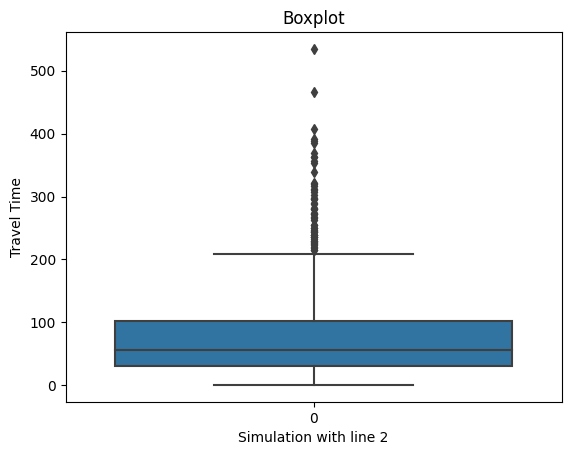

In [41]:
# Create a boxplot using Seaborn
sns.boxplot(time_result)

# Add labels and title (optional)
plt.xlabel("Simulation with line 2")
plt.ylabel("Travel Time")
plt.title("Boxplot")

# Show the plot
plt.show()


In [42]:
lines_taken = []
nodes_taken = []
for path in paths:
  bus_path = []
  for t in path:
    if isinstance(t, tuple):
      bus_path.append(t[1])
    else:
      nodes_taken.append(t)

  lines_taken.extend(list(set(bus_path)))

lines_taken1 = []
nodes_taken1 = []
for path in paths1:
  bus_path1 = []
  for t in path:
    if isinstance(t, tuple):
      bus_path1.append(t[1])
    else:
      nodes_taken1.append(t)

  lines_taken1.extend(list(set(bus_path1)))

In [43]:
from collections import Counter
element_counts = Counter(lines_taken)
sorted_elements = element_counts.most_common()
print(sorted_elements)

element_counts1 = Counter(lines_taken1)
sorted_elements1 = element_counts1.most_common()
print(sorted_elements1)


[('5', 265), ('3', 226), ('2', 109), ('1', 42)]
[('5', 293), ('3', 249), ('1', 39)]


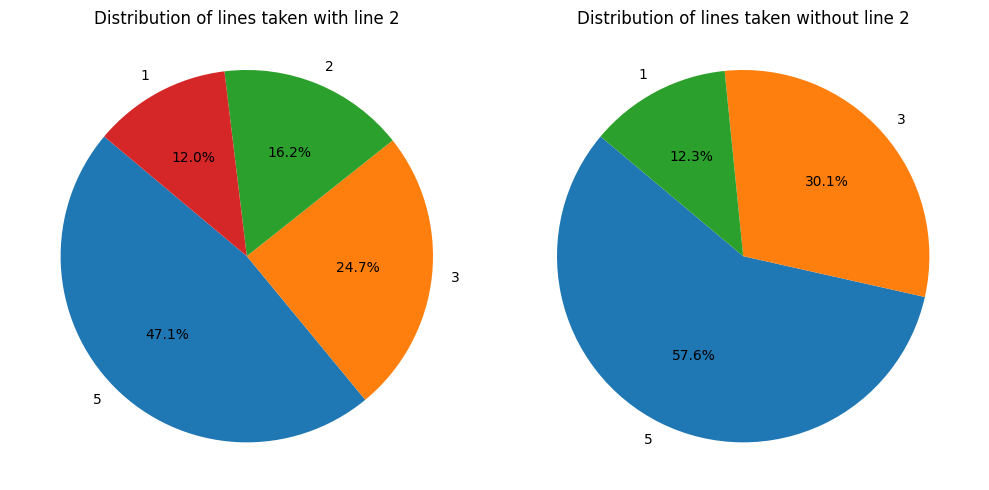

In [44]:
# Create subplots with two columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))

# Pie chart for sorted_elements
labels1, values1 = zip(*sorted_elements)
values1 = list(values1)
values1[0]=values1[0]/len(cinque_pd)
values1[1]=values1[1]/len(tre_pd)
values1[2]=values1[2]/len(due_pd)
values1[3]=values1[3]/len(uno_pd)
ax1.pie(values1, labels=labels1, autopct='%1.1f%%', startangle=140)
ax1.set_title('Distribution of lines taken with line 2')
ax1.axis('equal')

# Pie chart for sorted_elements1
labels2, values2 = zip(*sorted_elements1)
values2 = list(values2)
values2[0]=values2[0]/len(cinque_pd)
values2[1]=values2[1]/len(tre_pd)
values2[2]=values2[2]/len(uno_pd)
ax2.pie(values2, labels=labels2, autopct='%1.1f%%', startangle=140)
ax2.set_title('Distribution of lines taken without line 2')
ax2.axis('equal')

# Display the subplots
plt.tight_layout()
plt.show()

As we can see from the result of the simulation the greater demand is directed to the the line 5. After suppressing the line 2 the line 5 is the one which better intercept the mobility served by line 2